# About Dataset

 The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate.
 The target variable is Salary and we have to predict the salary of candidate according to their experinces and backgrounds.

# Importing Libraries

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [ ]:
data = pd.read_excel("aspiring_minds_employability_outcomes_2015.xlsx")
data.head(5)

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,"board ofsecondary education,ap",2007,95.8,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,cbse,2007,85.0,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,cbse,2010,68.2,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,cbse,2007,83.6,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,cbse,2008,76.8,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [ ]:
data.shape

(3998, 39)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             3998 non-null   object        
 1   ID                     3998 non-null   int64         
 2   Salary                 3998 non-null   int64         
 3   DOJ                    3998 non-null   datetime64[ns]
 4   DOL                    3998 non-null   object        
 5   Designation            3998 non-null   object        
 6   JobCity                3998 non-null   object        
 7   Gender                 3998 non-null   object        
 8   DOB                    3998 non-null   datetime64[ns]
 9   10percentage           3998 non-null   float64       
 10  10board                3998 non-null   object        
 11  12graduation           3998 non-null   int64         
 12  12percentage           3998 non-null   float64       
 13  12b

In [ ]:
data.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,2012.105803,501.649075,501.598799,513.378189,0.510490,353.102801,95.328414,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,31.857271,104.940021,86.783297,122.302332,0.468671,205.355519,158.241218,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,0.000000,180.000000,195.000000,120.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,2012.000000,425.000000,445.000000,430.000000,0.342315,295.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,2013.000000,500.000000,505.000000,515.000000,0.622643,415.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,2014.000000,570.000000,565.000000,595.000000,0.842248,495.000000,233.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,2017.000000,875.000000,795.000000,900.000000,0.999910,840.000000,612.000000,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


In [ ]:
data.isnull().sum()

Unnamed: 0               0
ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
n

In [ ]:
data['Unnamed: 0'].value_counts()

train    3998
Name: Unnamed: 0, dtype: int64

DOL is sohwing as object but it should be in datetime format.

In [ ]:
data['Designation'].value_counts()

software engineer           539
software developer          265
system engineer             205
programmer analyst          139
systems engineer            118
                           ... 
clerical assistant            1
software executive            1
documentation specialist      1
sales support                 1
seo analyst                   1
Name: Designation, Length: 419, dtype: int64

In [ ]:
data['CollegeState'].value_counts()

Uttar Pradesh        915
Karnataka            370
Tamil Nadu           367
Telangana            319
Maharashtra          262
Andhra Pradesh       225
West Bengal          196
Punjab               193
Madhya Pradesh       189
Haryana              180
Rajasthan            174
Orissa               172
Delhi                162
Uttarakhand          113
Kerala                33
Jharkhand             28
Chhattisgarh          27
Gujarat               24
Himachal Pradesh      16
Bihar                 10
Jammu and Kashmir      7
Union Territory        5
Assam                  5
Sikkim                 3
Meghalaya              2
Goa                    1
Name: CollegeState, dtype: int64

In [ ]:
df = data.copy()

In [ ]:
df.drop(columns=["Unnamed: 0",'CollegeID','CollegeCityID',],axis=1,inplace=True)

In [ ]:
df['DOL'].replace({'present':"2021"}, inplace=True)
df['DOL'] = pd.to_datetime(df['DOL'])

In [ ]:
cat_features = [feature for feature in df.columns if df[feature].dtype == 'O']
cat_features

['Designation',
 'JobCity',
 'Gender',
 '10board',
 '12board',
 'Degree',
 'Specialization',
 'CollegeState']

In [ ]:
df['12board'].unique()

array(['board of intermediate education,ap', 'cbse', 'state board',
       'mp board', 'isc', 'icse', 'karnataka pre university board', 'up',
       'p u board, karnataka', 'dept of pre-university education', 'bie',
       'kerala state hse board', 'up board', 0, 'bseb', 'chse', 'puc',
       ' upboard',
       'state  board of intermediate education, andhra pradesh',
       'karnataka state board',
       'west bengal state council of technical education', 'wbchse',
       'maharashtra state board', 'ssc', 'isc board',
       'sda matric higher secondary school', 'uttar pradesh board', 'ibe',
       'chsc', 'board of intermediate', 'isce', 'upboard', 'sbtet',
       'hisher seconadry examination(state board)', 'pre university',
       'borad of intermediate', 'j & k board',
       'intermediate board of andhra pardesh', 'rbse',
       'central board of secondary education', 'jkbose', 'hbse',
       'board of intermediate education', 'state', 'ms board', 'pue',
       'intermediate sta

Mainly we divide boards into state, cbse and icse. So here by dividing them into this, it will be eaiser to analyse the data.

In [ ]:
state =['board of intermediate education,ap', 'state board',
       'mp board',  'karnataka pre university board', 'up',
       'p u board, karnataka', 'dept of pre-university education', 'bie',
       'kerala state hse board', 'up board', 'bseb', 'chse', 'puc',
       ' upboard',
       'state  board of intermediate education, andhra pradesh',
       'karnataka state board',
       'west bengal state council of technical education', 'wbchse',
       'maharashtra state board', 'ssc',
       'sda matric higher secondary school', 'uttar pradesh board', 'ibe',
       'chsc', 'board of intermediate', 'upboard', 'sbtet',
       'hisher seconadry examination(state board)', 'pre university',
       'borad of intermediate', 'j & k board',
       'intermediate board of andhra pardesh', 'rbse',
       'central board of secondary education', 'jkbose', 'hbse',
       'board of intermediate education', 'state', 'ms board', 'pue',
       'intermediate state board', 'stateboard', 'hsc',
       'electonincs and communication(dote)', 'karnataka pu board',
       'government polytechnic mumbai , mumbai board', 'pu board',
       'baord of intermediate education', 'apbie', 'andhra board',
       'tamilnadu stateboard',
       'west bengal council of higher secondary education',
       'cbse,new delhi', 'u p board', 'intermediate', 'biec,patna',
       'diploma in engg (e &tc) tilak maharashtra vidayapeeth',
       'hsc pune', 'pu board karnataka', 'kerala', 'gsheb',
       'up(allahabad)', 'nagpur', 'st joseph hr sec school',
       'pre university board', 'ipe', 'maharashtra', 'kea', 'apsb',
       'himachal pradesh board of school education', 'staae board',
       'international baccalaureate (ib) diploma', 'nios',
       'karnataka board of university',
       'board of secondary education rajasthan', 'uttarakhand board',
       'ua', 'scte vt orissa', 'matriculation',
       'department of pre-university education', 'wbscte',
       'preuniversity board(karnataka)', 'jharkhand accademic council',
       'bieap', 'msbte (diploma in computer technology)',
       'jharkhand acamedic council (ranchi)',
       'department of pre-university eduction', 'biec',
       'sjrcw', ' board of intermediate', 'msbte',
       'sri sankara vidyalaya', 'chse, odisha', 'bihar board',
       'maharashtra state(latur board)', 'rajasthan board', 'mpboard',
       'state board of technical eduction panchkula', 'upbhsie', 'apbsc',
        'state board of technical education and training',
       'secondary board of rajasthan',
       'tamilnadu higher secondary education board',
       'jharkhand academic council',
       'board of intermediate education,hyderabad', 'up baord', 'pu',
       'dte', 'board of secondary education', 'pre-university',
       'board of intermediate education,andhra pradesh',
       'up board , allahabad', 'srv girls higher sec school,rasipuram',
       'intermediate board of education,andhra pradesh',
       'intermediate board examination',
       'department of pre-university education, bangalore',
       'stmiras college for girls', 'mbose',
       'department of pre-university education(government of karnataka)',
       'dpue', 'msbte pune', 'board of school education harayana',
       'sbte, jharkhand', 'bihar intermediate education council, patna',
       'higher secondary', 's j polytechnic', 'latur',
       'board of secondary education, rajasthan', 'jyoti nivas', 'pseb',
       'biec-patna', 'board of intermediate education,andra pradesh',
       'chse,orissa', 'pre-university board', 'mp', 'intermediate board',
       'govt of karnataka department of pre-university education',
       'karnataka education board',
       'board of secondary school of education', 'pu board ,karnataka',
       'karnataka secondary education board', 'karnataka sslc',
       'board of intermediate ap', 'u p', 'state board of karnataka',
       'directorate of technical education,banglore', 'matric board',
       'andhpradesh board of intermediate education',
       'stjoseph of cluny matrhrsecschool,neyveli,cuddalore district',
       'bte up', 'scte and vt ,orissa', 'hbsc',
       'jawahar higher secondary school', 'nagpur board', 'bsemp',
       'board of intermediate education, andhra pradesh',
       'board of higher secondary orissa',
       'board of secondary education,rajasthan(rbse)',
       'board of intermediate education:ap,hyderabad', 'science college',
       'karnatak pu board', 'aissce', 'pre university board of karnataka',
       'bihar', 'kerala state board', 'uo board', 
       'karnataka board', 'tn state board',
       'kolhapur divisional board, maharashtra',
       'jaycee matriculation school',
       'board of higher secondary examination, kerala',
       'uttaranchal state board', 'intermidiate', 'bciec,patna', 'bice',
       'karnataka state', 'state broad', 'wbbhse', 'gseb',
       'uttar pradesh', 'ghseb', 'board of school education uttarakhand',
        'gseb/technical education board', 'msbshse,pune',
       'tamilnadu state board', 'board of technical education',
       'kerala university', 'uttaranchal shiksha avam pariksha parishad',
       'chse(concil of higher secondary education)',
       'bright way college, (up board)', 'board of intermidiate',
       'higher secondary state certificate', 'karanataka secondary board',
       'maharashtra board', 'cgbse', 'diploma in computers', 'bte,delhi',
       'rajasthan board ajmer', 'mpbse', 'pune board',
       'state board of technical education', 'gshseb',
       'amravati divisional board', 'dote (diploma - computer engg)',
       'karnataka pre-university board', 'jharkhand board',
       'punjab state board of technical education & industrial training',
       'department of technical education',
       'sri chaitanya junior kalasala', 'state board (jac, ranchi)',
       'aligarh muslim university', 'tamil nadu state board', 'hse',
       'karnataka secondary education', 'state board ',
       'karnataka pre unversity board',
       'ks rangasamy institute of technology',
       'karnataka board secondary education', 'narayana junior college',
       'bteup', 'board of intermediate(bie)', 'hsc maharashtra board',
       'tamil nadu state', 'uttrakhand board', 'psbte',
       'stateboard/tamil nadu', 'intermediate council patna',
       'technical board, punchkula', 'board of intermidiate examination',
       'sri kannika parameswari highier secondary school, udumalpet',
       'ap board', 'nashik board', 'himachal pradesh board',
       'maharashtra satate board',
       'andhra pradesh board of secondary education',
       'tamil nadu polytechnic',
       'maharashtra state board mumbai divisional board',
       'department of pre university education',
       'dav public school,hehal', 'board of intermediate education, ap',
       'rajasthan board of secondary education',
       'department of technical education, bangalore', 'chse,odisha',
       'maharashtra nasik board',
       'west bengal council of higher secondary examination (wbchse)',
       'holy cross matriculation hr sec school', 'cbsc',
       'pu  board karnataka', 'biec patna', 'kolhapur', 'bseb, patna',
       'up board allahabad', 'nagpur board,nagpur', 'diploma(msbte)',
        'dav public school', 'pre university board, karnataka',
       'ssm srsecschool', 'state bord', 'jstb,jharkhand',
       'intermediate board of education', 'mp board bhopal', 'pub',
       'madhya pradesh board', 'bihar intermediate education council',
       'west bengal council of higher secondary eucation',
        'mpc',
       'certificate for higher secondary education (chse)orissa',
       'maharashtra state board for hsc',
       'board of intermeadiate education', 'latur board',
       'andhra pradesh', 'karnataka pre-university',
       'lucknow public college', 'nagpur divisional board',
       'ap intermediate board', 'cgbse raipur', 'uttranchal board',
       'jiec', 
       'bihar school examination board patna',
       'state board of technical education harayana', 'mp-bse',
       'up bourd', 'dav public school sec 14',
       'haryana state board of technical education chandigarh',
       'council for indian school certificate examination',
       'jaswant modern school', 'madhya pradesh open school',
       'aurangabad board', 'j&k state board of school education',
       'diploma ( maharashtra state board of technical education)',
       'board of technicaleducation ,delhi',
       'maharashtra state boar of secondary and higher secondary education',
       'hslc (tamil nadu state board)',
       'karnataka state examination board', 'puboard', 'nasik',
       'west bengal board of higher secondary education',
       'up board,allahabad', 'board of intrmediate education,ap', 
       'karnataka state pre- university board',
       'state board - west bengal council of higher secondary education : wbchse',
       'maharashtra state board of secondary & higher secondary education',
       'biec, patna', 'state syllabus', 'cbse board', 'scte&vt',
       'board of intermediate,ap',
       'secnior secondary education board of rajasthan',
       'maharashtra board, pune', 'rbse (state board)',
       'board of intermidiate education,ap',
       'board of high school and intermediate education uttarpradesh',
       'higher secondary education','board fo intermediate education, ap', 'intermedite',
       'ap board for intermediate education', 'ahsec',
       'punjab state board of technical education & industrial training, chandigarh',
       'state board - tamilnadu', 'jharkhand acedemic council',
       'scte & vt (diploma)', 'karnataka pu',
       'board of intmediate education ap', 'up-board',
       'boardofintermediate','andhra pradesh state board','up bord','gujarat board','intermideate']



cbse = ['cbse board','central board of secondary education, new delhi', 'cbsc','cgbse','all india board','cbese']
icse = ['icse board , new delhi','icse','isc', 'icse', 'isc board', 'isce', 'cicse',
       'isc board , new delhi']

In [ ]:
for i in state:
  df['12board'].replace(i,'state',inplace=True)

for i in cbse:
  df['12board'].replace(i,'cbse',inplace=True)

for i in icse:
  df['12board'].replace(i,'icse',inplace=True)

df['12board'].replace(0,'n/a',inplace=True)

In [ ]:
state10 = ['board ofsecondary education,ap',
       'karnataka secondary school of examination',
       'karnataka state education examination board',
       'kerala state technical education',
       'state board of secondary education, andhra pradesh',
       'gujarat state board', 'wbbse',
       'board of secondary education(bse) orissa',
       'little jacky matric higher secondary school', 'bsc,orissa',
       'matriculation board', 'j & k bord',
       'haryana board of school education,(hbse)', 'metric', 'kseeb',
       'maticulation', 'karnataka secondory education board',
       'mumbai board', 'sslc', 'kseb', 'board secondary  education',
       'west bengal board of secondary education',
       'jharkhand secondary examination board,ranchi', 'bseb,patna',
       'bse', 'sss pune', 'karnataka education board (keeb)',
       'state board of secondary education( ssc)',
       'don bosco maatriculation school',
       'karnataka state secondary education board',
       'certificate of middle years program of ib',
       'karnataka board of secondary education',
       'board of secendary education orissa',
       'karantaka secondary education and examination borad',
       'kseeb(karnataka secondary education examination board)',
       'state(karnataka board)',
       'jharkhand secondary examination board (ranchi)',
       'karnataka secondary education examination board', 'delhi board',
       'mirza ahmed ali baig', 'jseb', 'bse, odisha',
       'tamilnadu matriculation board', 'jharkhand secondary board',
       'board of secondary education,andhara pradesh',
       'state board of secondary education,andhra pradesh',
       'stjosephs girls higher sec school,dindigul',
       'education board of kerala', 'board of ssc',
       'maharashtra state board pune', 'secondary school cerfificate',
       'maharashtra sate board', 'ksseb',
       'bihar examination board, patna', 'state borad hp', 'cluny',
       'bsepatna', 'up borad', 'ssc board of andrapradesh', 'matric',
       'bse,orissa', 'ssc-andhra pradesh', 'mhsbse',
       'karnataka sslc board bangalore', 'karnataka',
       'secondary school of education', 'karnataka secondary board',
       'andhra pradesh board ssc', 'hse,orissa', 'national public school',
       'board of secondary education, andhra pradesh',
       'board of secondary education orissa',
       'board of secondary education,ap',
       'board of secondary education,andhra pradesh',
       'jawahar navodaya vidyalaya', 'aisse',
       'karnataka board of higher education',
       'bharathi matriculation school', 'wbbsce', 'mp state board',
       'seba(assam)', 'anglo indian', 'bse(board of secondary education)',
       'school secondary education, andhra pradesh',
       'secondary state certificate',
       'maharashtra state board of secondary and higher secondary education,pune',
       'stmary higher secondary', 'secondary school certificate',
       'board of secondary education,orissa',
       'maharashtra state board,pune', 'kiran english medium high school',
       'sarada high scchool',
       'kalaimagal matriculation higher secondary school',
       'maharastra board', 'sslc board', 'ssc maharashtra board',
       'bihar secondary education board,patna',
       'haryana board of school education',
       'ksseb(karnataka state board)',
       'jharkhand secondary education board',
       'state board of secondary education, ap', 'hsce',
       'board of secondary education,odisha',
       'west bengal board of secondary examination (wbbse)', 'apssc',
       'bseb patna', 'biharboard', 'pune', 'gyan bharati school',
       'rbse,ajmer', 'board of secondaray education',
       'secondary school education', 'jbse,jharkhand',
       'bihar school examination board',
       'west bengal board of secondary eucation', 'state boardmp board ',
       'board of secondary education (bse) orissa',
       'maharashtra state board for ssc',
       'board of secondary school education',
       "stmary's convent inter college", 'ap state board', 'ksbe',
       'sslc,karnataka', 'board of school education haryana',
       'maharashtra state board of secondary and higher secondary education',
       'ssc regular', 'west bengal  board of secondary education',
       'bseb ,patna',
       'state board - west bengal board of secondary education : wbbse',
       'delhi public school', 'karnataka secondary eduction',
       'secondary education board of rajasthan', 'apsche',
       'board of  secondary education',
       'board of secondary education - andhra pradesh',
       'ap state board for secondary education', 'seba',
       'punjab school education board, mohali', 'hse,board',
       'board of ssc education andhra pradesh', 'bse,odisha']

cbse10 = ['cbse board','central board of secondary education, new delhi','cbse ', 'cbsc','cgbse','all india board','cbese','cbse[gulf zone]']
icse10 = ['icse board , new delhi','icse','isc', 'icse', 'isc board', 'isce', 'cicse','icse board',
       'isc board , new delhi']

In [ ]:
for i in state10:
  df['10board'].replace(i,'state',inplace=True)

for i in cbse10:
  df['10board'].replace(i,'cbse',inplace=True)

for i in icse10:
  df['10board'].replace(i,'icse',inplace=True)

df['10board'].replace(0,'n/a',inplace=True)

In [ ]:
df['12board'].unique()

array(['state', 'cbse', 'icse', 'n/a'], dtype=object)

In [ ]:
df['10board'].unique()

array(['state', 'cbse', 'state board', 'mp board bhopal', 'icse', 'up',
       'ssc', 'n/a', 'bseb', 'matriculation', 'karnataka state board',
       'maharashtra state board', 'up board', 'uttar pradesh board',
       'mp board', 'upboard', 'rbse',
       'central board of secondary education', 'pseb', 'jkbose',
       'ms board', 'stateboard', 'matric board',
       'board of secondary education', 'u p board', 'hsc', 'kerala',
       'gsheb', 'up(allahabad)', 'nagpur', 'maharashtra',
       'karnataka secondary education board',
       'himachal pradesh board of school education',
       'board of secondary education rajasthan', 'uttarakhand board',
       'ua', 'hbsc', 'hbse', 'jharkhand accademic council', 'bihar board',
       'maharashtra state(latur board)', 'rajasthan board', 'mpboard',
       'upbhsie', 'secondary board of rajasthan', 'up baord',
       'board of intermediate education', 'up board , allahabad',
       'maharashtra board', 'board of school education harayana', 

In [ ]:
df.head(5)

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000,2012-06-01,2021-01-01,senior quality engineer,Bangalore,f,1990-02-19,84.3,state,2007,95.8,state,2,B.Tech/B.E.,computer engineering,78.00,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000,2013-09-01,2021-01-01,assistant manager,Indore,m,1989-10-04,85.4,cbse,2007,85.0,cbse,2,B.Tech/B.E.,electronics and communication engineering,70.06,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000,2014-06-01,2021-01-01,systems engineer,Chennai,f,1992-08-03,85.0,cbse,2010,68.2,cbse,2,B.Tech/B.E.,information technology,70.00,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000,2011-07-01,2021-01-01,senior software engineer,Gurgaon,m,1989-12-05,85.6,cbse,2007,83.6,cbse,1,B.Tech/B.E.,computer engineering,74.64,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000,2014-03-01,2015-03-01,get,Manesar,m,1991-02-27,78.0,cbse,2008,76.8,cbse,2,B.Tech/B.E.,electronics and communication engineering,73.90,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [ ]:
num_feat = df.select_dtypes(include = ['int64','float64'])
num_feat.head()

,ID,Salary,10percentage,12graduation,12percentage,CollegeTier,collegeGPA,CollegeCityTier,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000,84.3,2007,95.8,2,78.00,0,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000,85.4,2007,85.0,2,70.06,0,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000,85.0,2010,68.2,2,70.00,0,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000,85.6,2007,83.6,1,74.64,1,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000,78.0,2008,76.8,2,73.90,0,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


# Univarient Analysis

## Numerical data analysis

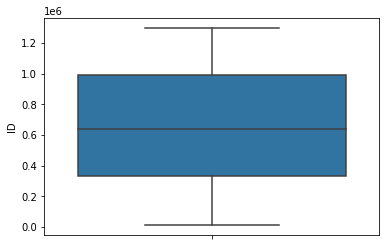

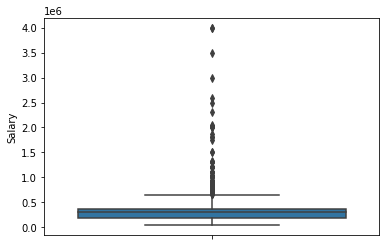

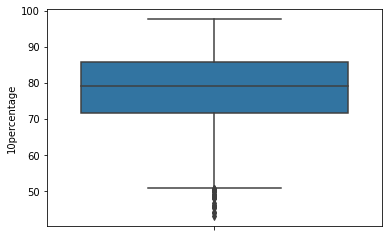

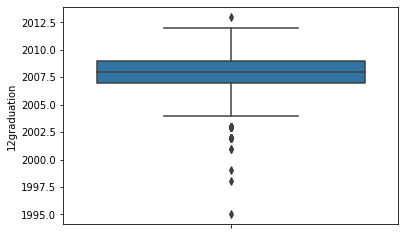

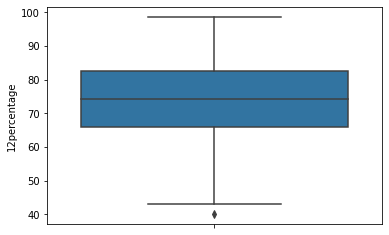

...

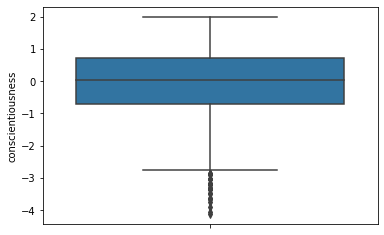

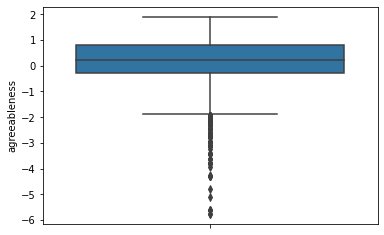

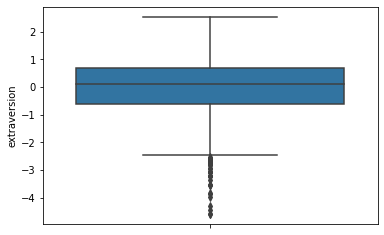

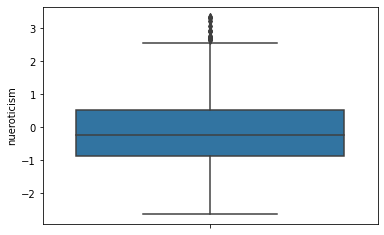

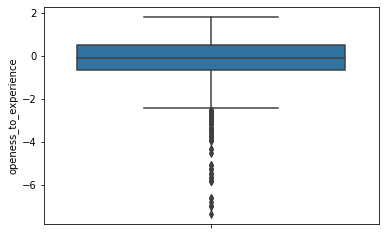

In [ ]:
for feature in num_feat.columns:
  plt.figure(feature);
  sns.boxplot(y = feature, data = num_feat);

From above boxplot it is clear that data have outliers in every column.

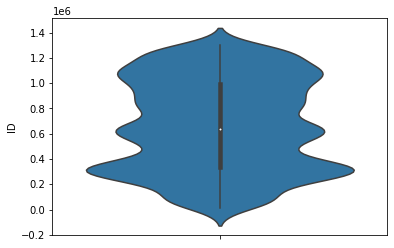

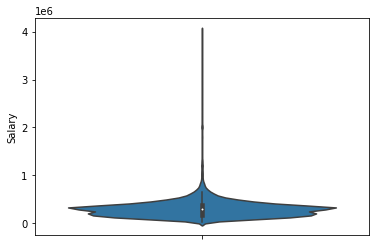

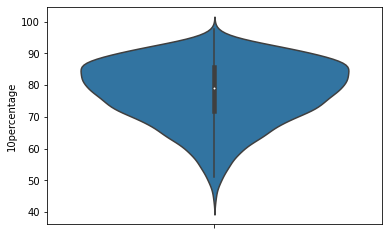

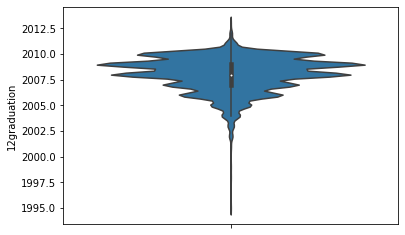

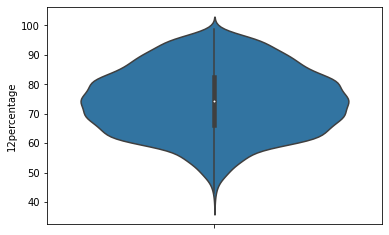

...

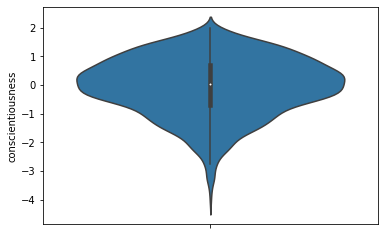

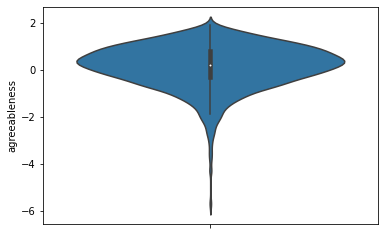

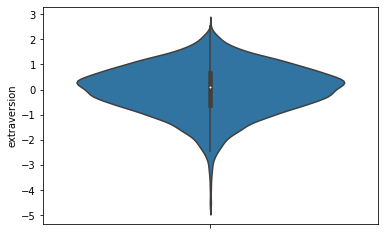

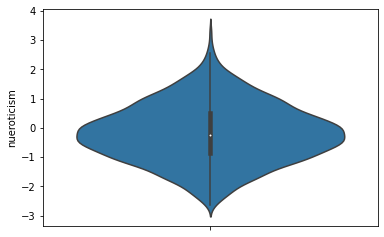

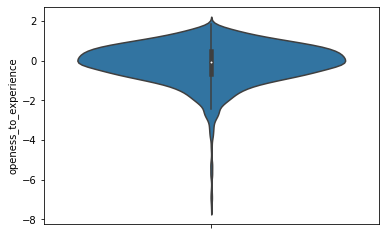

In [ ]:
for feature in num_feat.columns:
  plt.figure(feature)
  sns.violinplot(y = feature, data = num_feat)

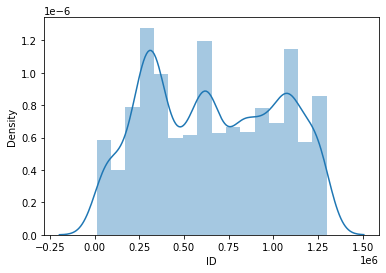

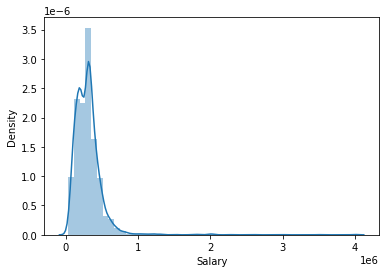

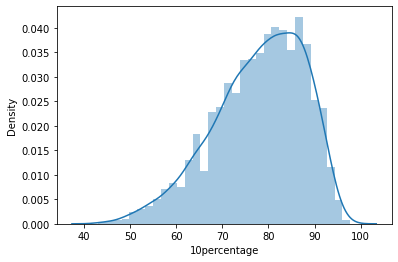

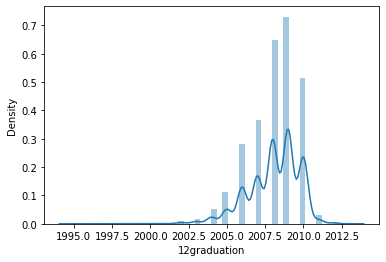

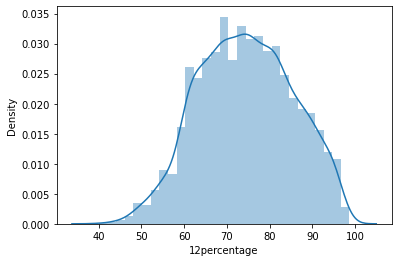

...

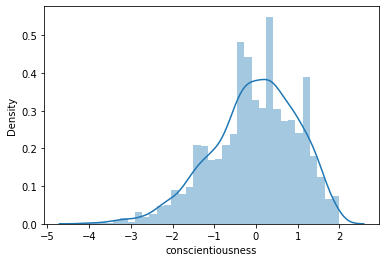

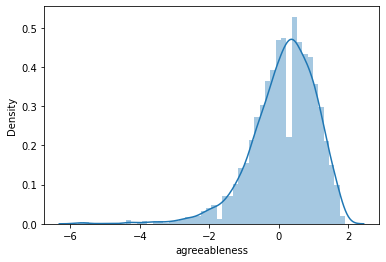

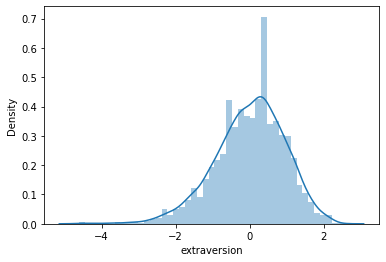

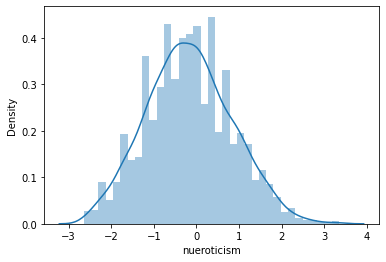

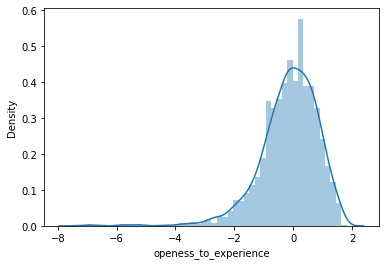

In [ ]:
for feature in num_feat.columns:
  plt.figure(feature)
  sns.distplot(num_feat[feature])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7feff5ea2890>,
      dtype=object)

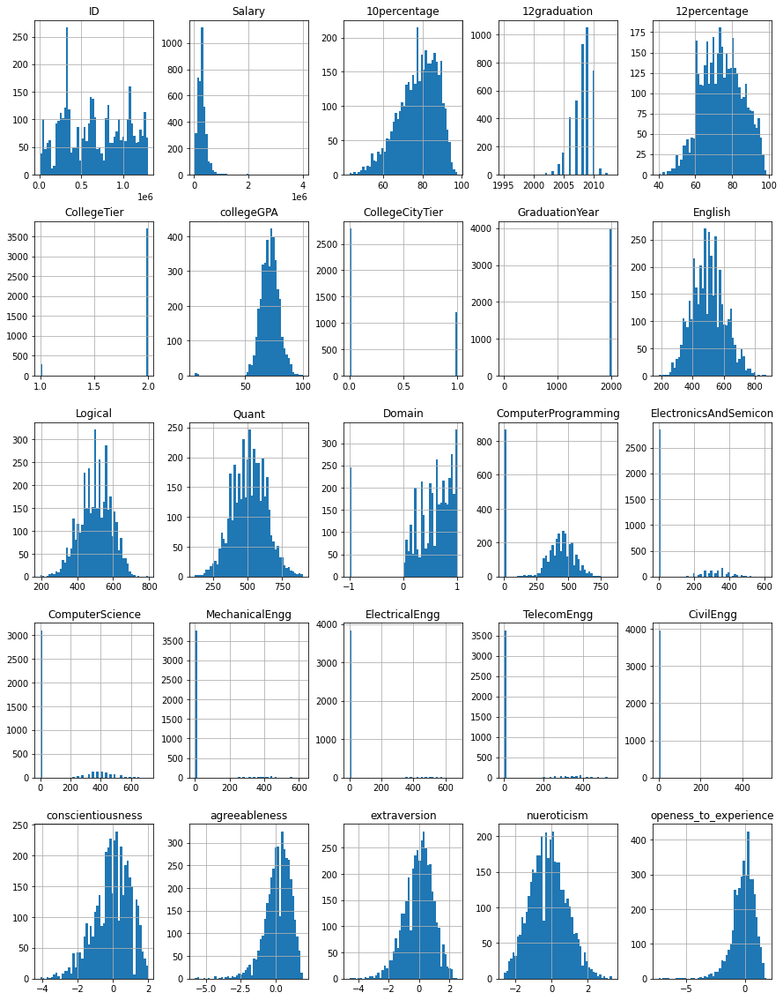

In [ ]:
num_feat.hist(figsize=(15, 20), bins=50, xlabelsize=10, ylabelsize=10)

## Categorical data analysis

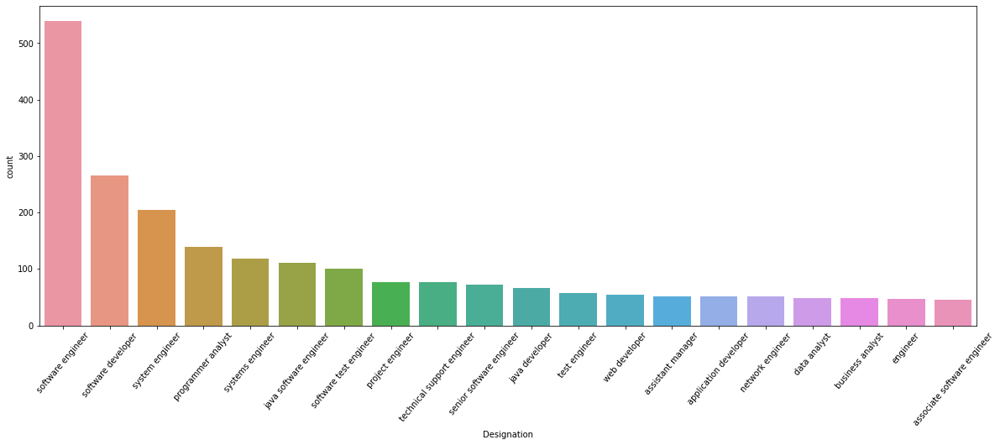

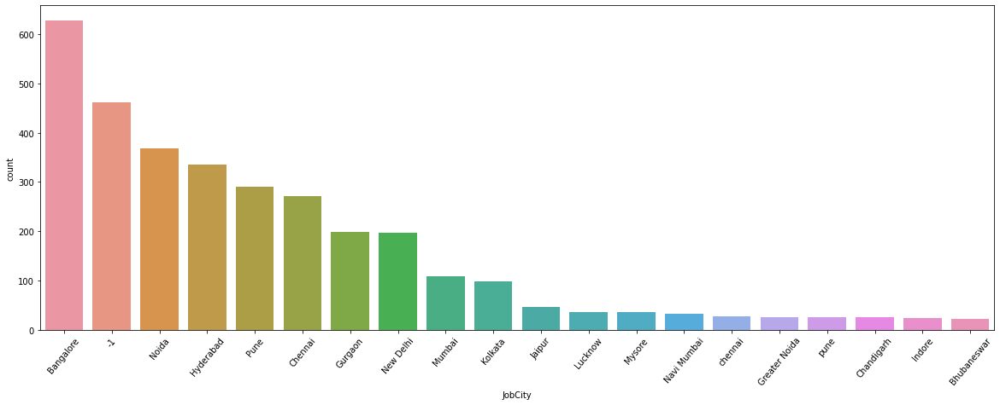

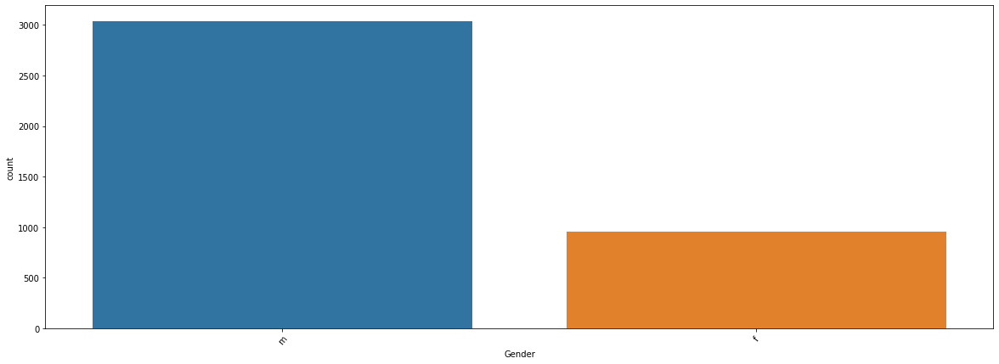

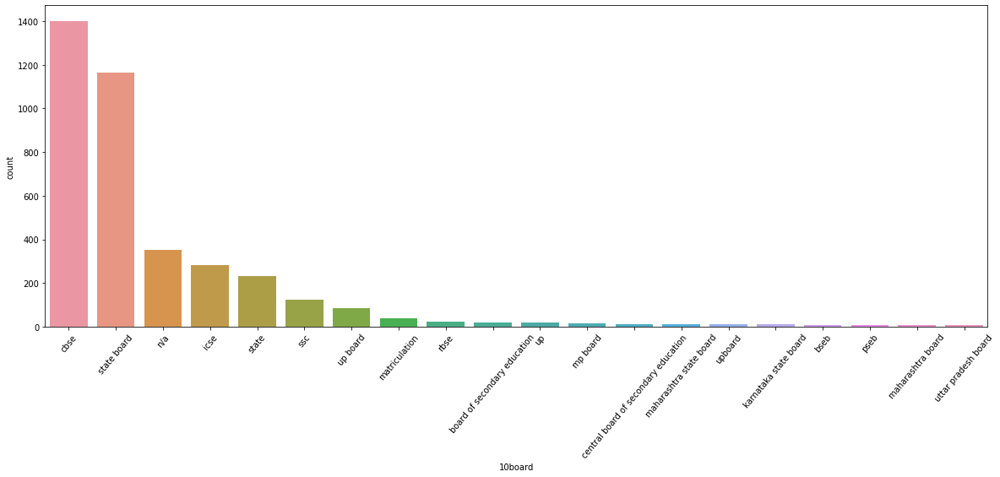

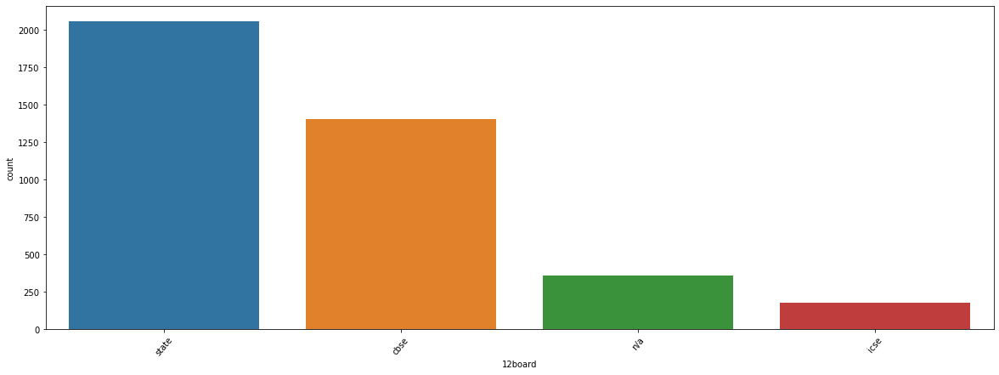

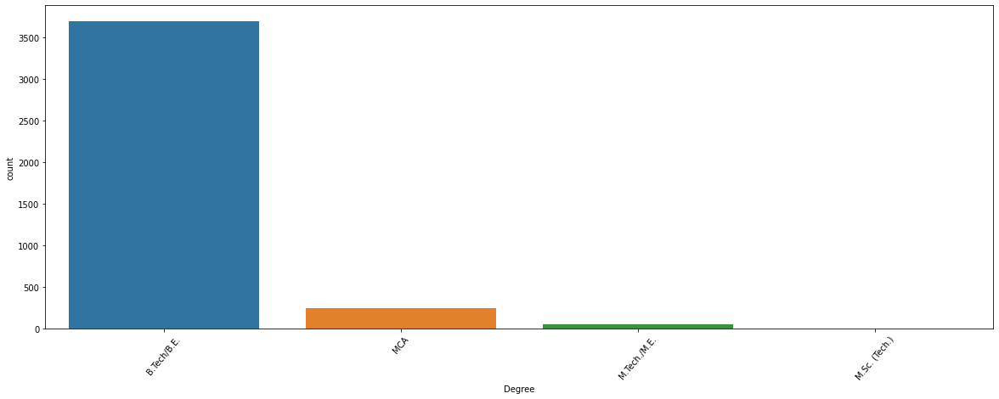

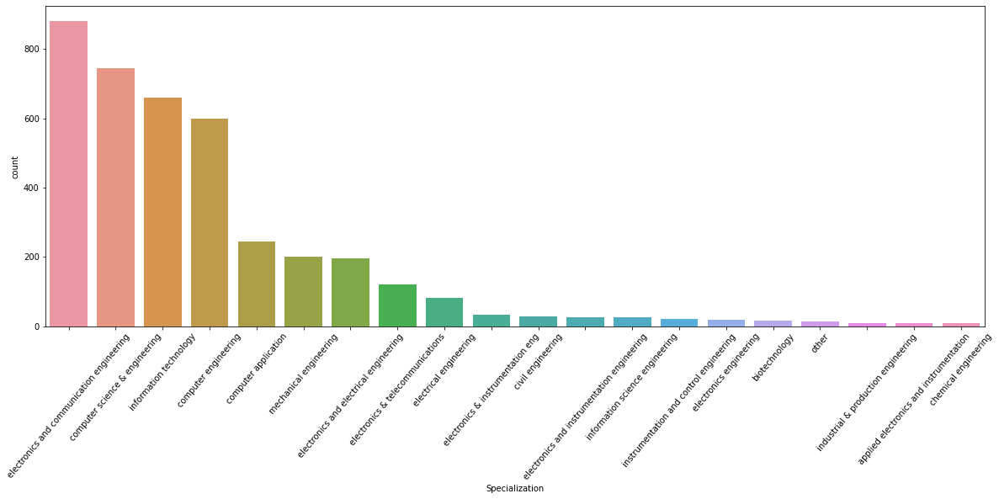

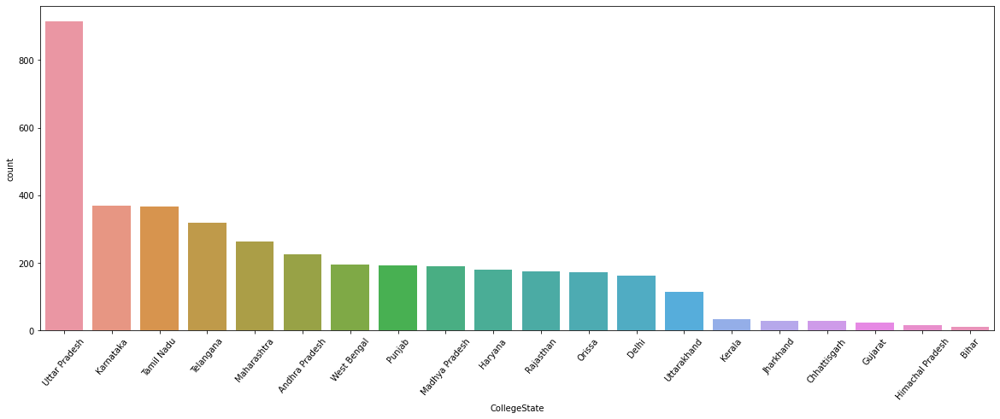

In [ ]:
for i in cat_features:
    plt.figure(figsize=(20,7))
    sns.countplot(df[i].dropna(), order=df[i].value_counts().iloc[:20].index)
    plt.xticks(rotation=50)

# Bivarent Analysis

## Numerical Analysis

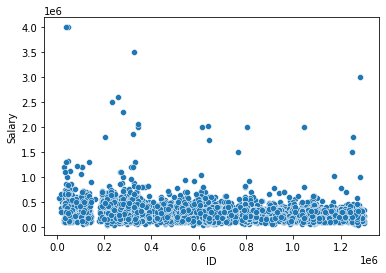

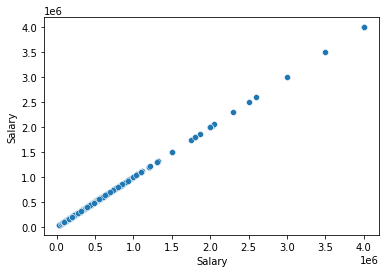

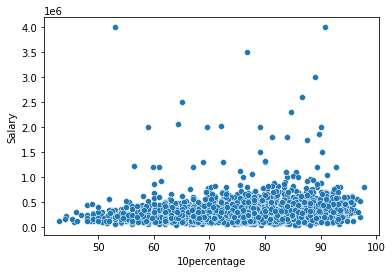

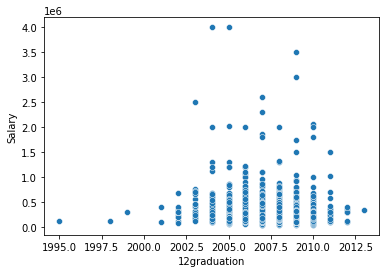

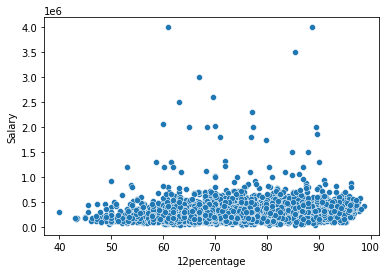

...

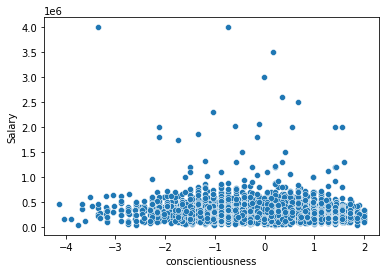

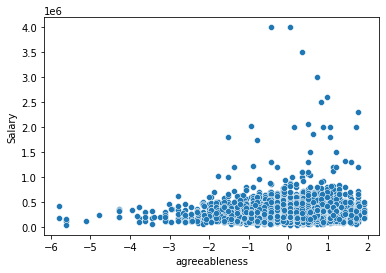

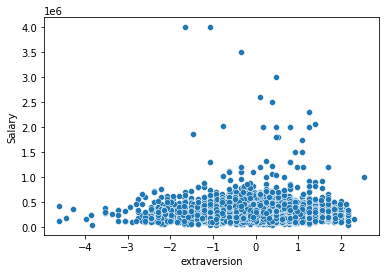

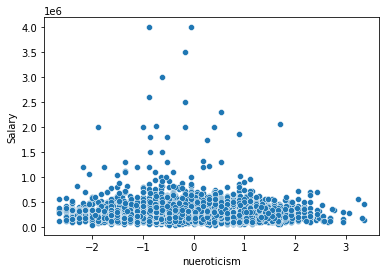

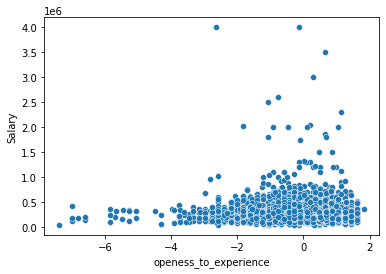

In [ ]:
# Scatter plot
for i in num_feat.columns:
    plt.figure(i);
    sns.scatterplot(x=i,y="Salary",data=num_feat)

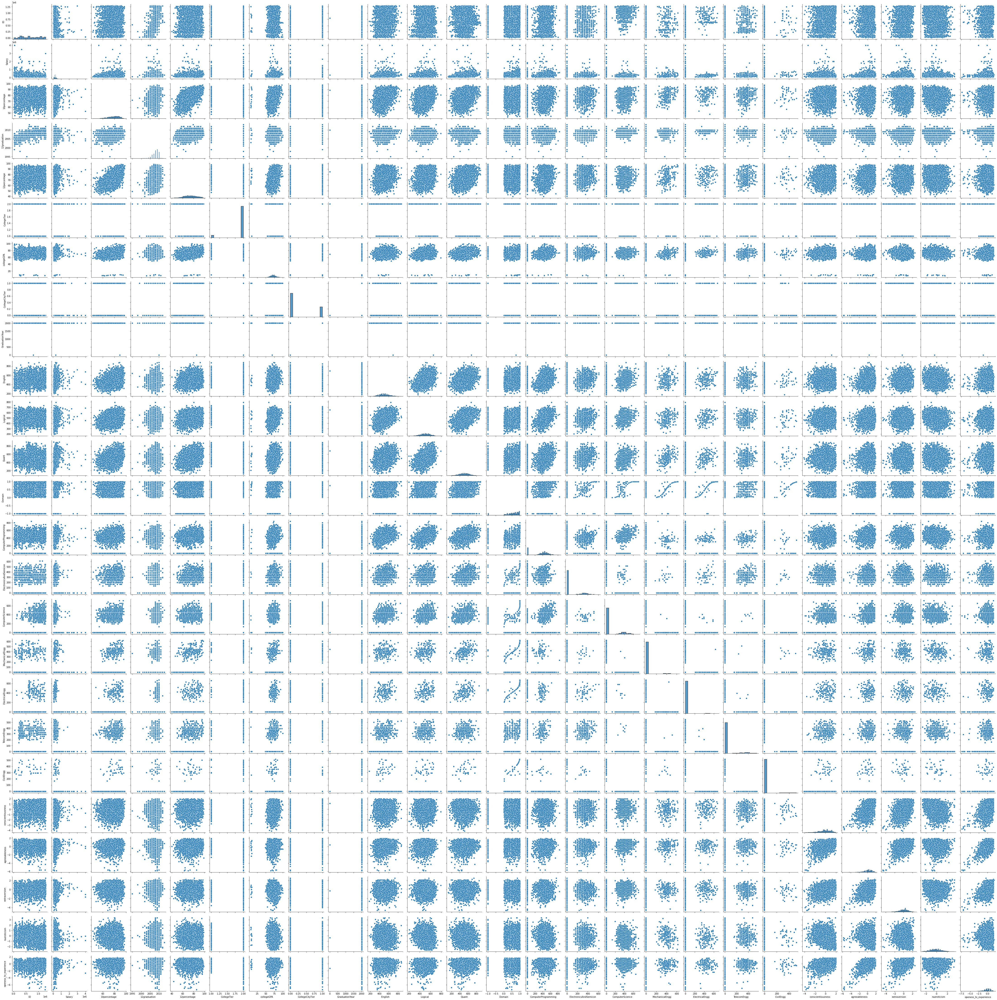

In [ ]:
sns.pairplot(num_feat)

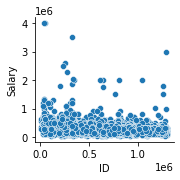

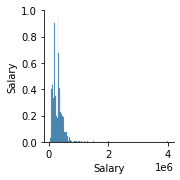

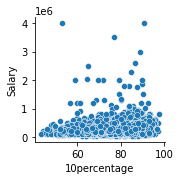

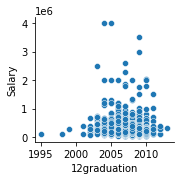

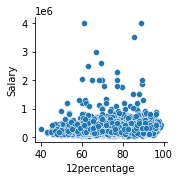

...

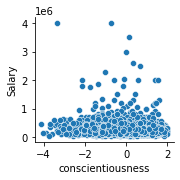

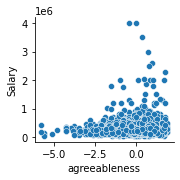

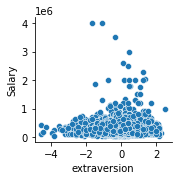

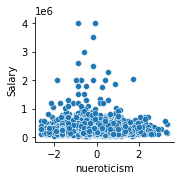

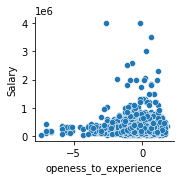

In [ ]:
#Pair plot based on Salary column.
for i in range(0, len(num_feat.columns)):
  sns.pairplot(data=num_feat,x_vars=num_feat.columns[i],y_vars=['Salary'])

## Relation Between Categorical and Numerical column

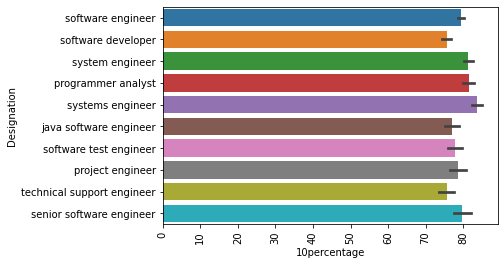

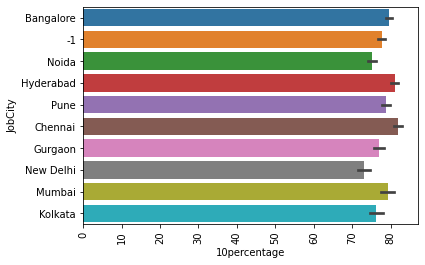

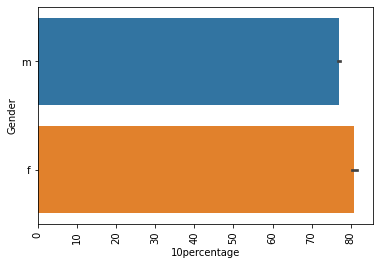

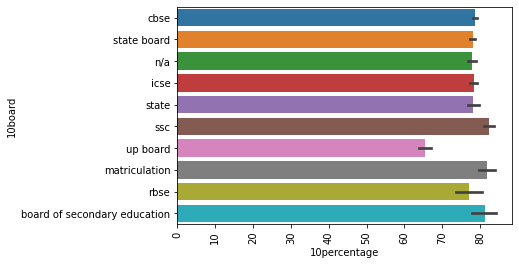

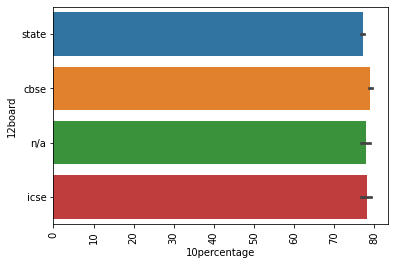

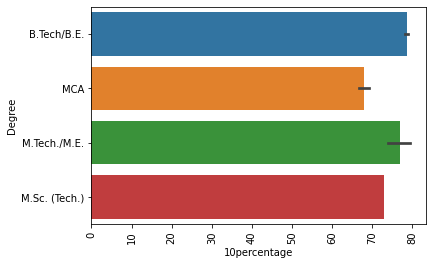

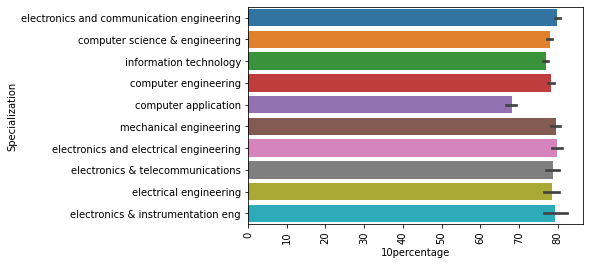

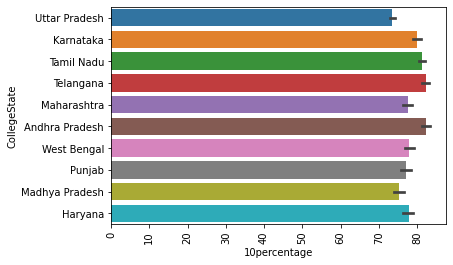

In [ ]:
for i in cat_features:
    plt.figure(i);
    sns.barplot(x=df["10percentage"],y=df[i],order=df[i].value_counts().iloc[:10].index)
    plt.xticks(rotation=90)

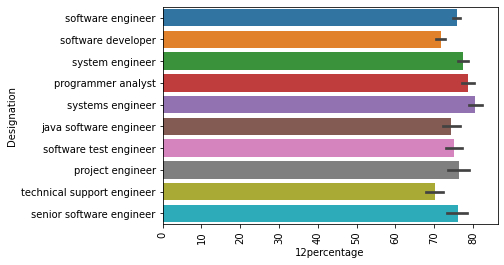

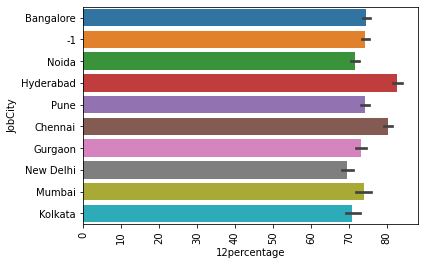

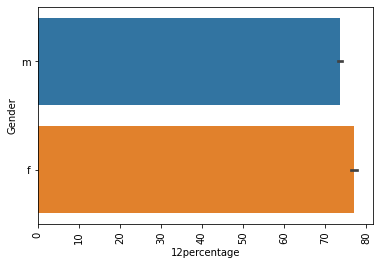

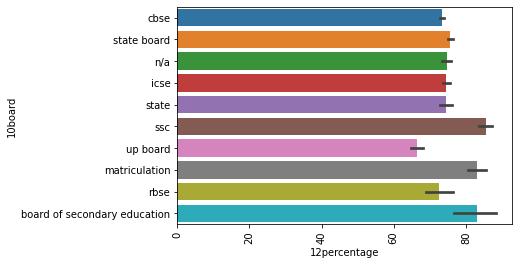

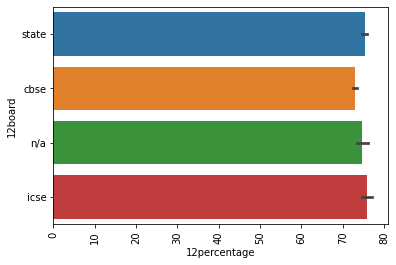

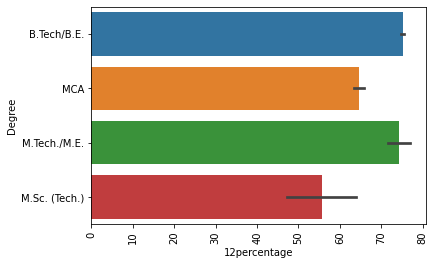

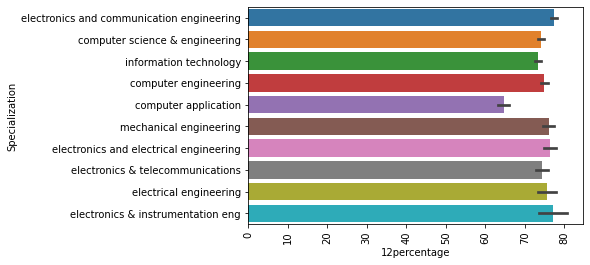

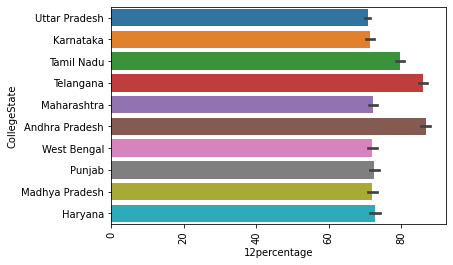

In [ ]:
for i in cat_features:
    plt.figure(i);
    sns.barplot(x=df["12percentage"],y=df[i],order=df[i].value_counts().iloc[:10].index);
    plt.xticks(rotation=90)

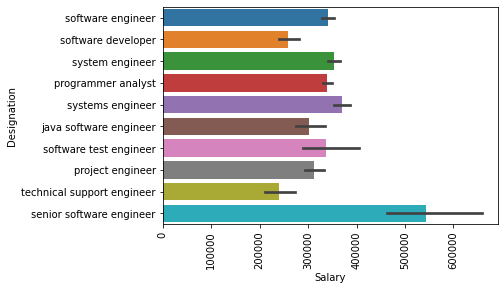

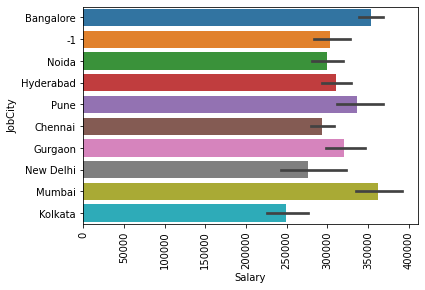

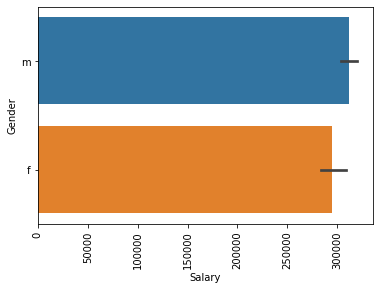

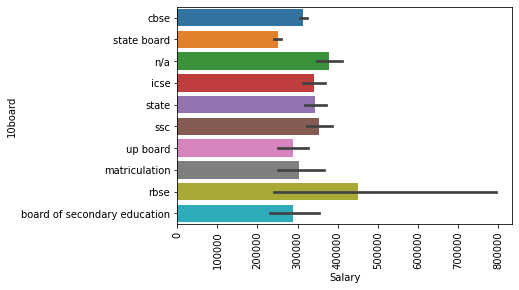

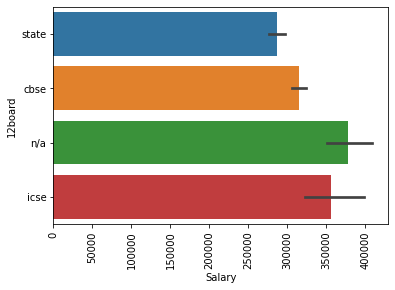

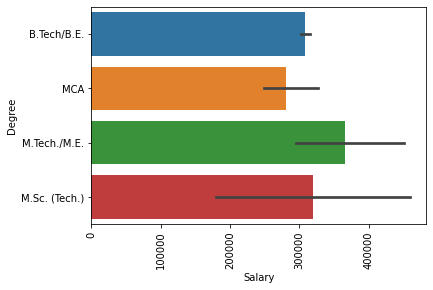

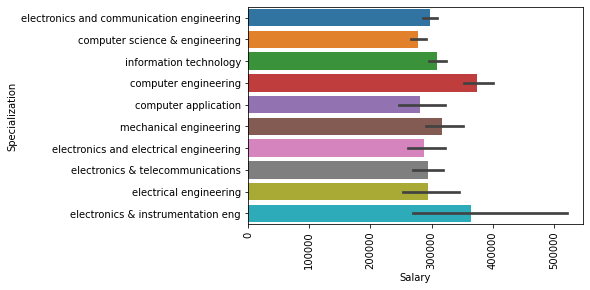

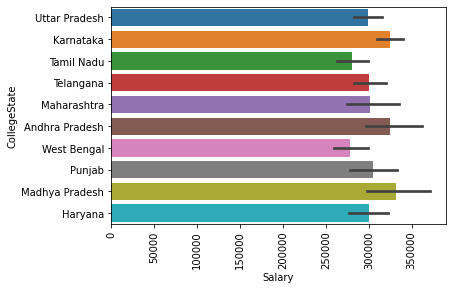

In [ ]:
for i in cat_features:
    plt.figure(i);
    sns.barplot(x=df["Salary"],y=df[i],order=df[i].value_counts().iloc[:10].index);
    plt.xticks(rotation=90)

# Hypothesis

> Times of India article dated Jan 18, 2019 states that “After doing your Computer Science
Engineering if you take up jobs as a Programming Analyst, Software Engineer,
Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh
graduate.” Test this claim.

In [ ]:
df['Joining_year']=pd.DatetimeIndex(df['DOJ']).year

In [ ]:
# Below dataset contains data of freshers who got job and have specialization in Computer Science & Engineering
freshers = df[(df['Specialization']=='computer science & engineering')&(df['GraduationYear']==df['Joining_year'])]

In [ ]:
freshers.head(5)

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Joining_year
6,947847,300000,2014-08-01,2015-05-01,java software engineer,Banglore,m,1993-02-01,86.08,state board,2010,67.5,state,2,B.Tech/B.E.,computer science & engineering,72.98,1,Karnataka,2014,590,435,380,0.356536,405,-1,346,-1,-1,-1,-1,1.7081,-0.1054,-1.0379,-2.0092,-1.0872,2014
24,963123,335000,2014-06-01,2015-06-01,programmer analyst,Hyderabad,m,1993-06-28,88.00,state board,2010,90.0,state,2,B.Tech/B.E.,computer science & engineering,76.00,1,Telangana,2014,625,555,630,0.356536,475,-1,346,-1,-1,-1,-1,0.4155,0.8027,0.1357,-0.9950,-0.6692,2014
25,350211,435000,2012-09-01,2021-01-01,systems analyst,Gurgaon,f,1991-03-02,86.80,cbse,2008,82.8,cbse,2,B.Tech/B.E.,computer science & engineering,78.00,0,Haryana,2012,575,585,575,0.744758,565,-1,438,-1,-1,-1,-1,0.0464,1.2028,-0.9245,0.5323,-0.2875,2012
31,1094324,340000,2014-08-01,2015-04-01,software engineer,Bangalore,m,1992-10-23,77.20,state board,2010,86.1,state,2,B.Tech/B.E.,computer science & engineering,71.00,0,Tamil Nadu,2014,560,485,450,0.622643,485,-1,407,-1,-1,-1,-1,-0.0154,1.2114,1.0859,-1.5021,0.2889,2014
41,955678,145000,2014-07-01,2014-09-01,software developer,Delhi,m,1992-04-21,75.00,cbse,2009,60.0,cbse,2,B.Tech/B.E.,computer science & engineering,66.00,0,Uttar Pradesh,2014,380,545,460,0.356536,395,-1,346,-1,-1,-1,-1,-0.8772,-1.1196,-1.0659,-1.2486,-1.4356,2014


In [ ]:
freshers['new_salary'] = freshers['Salary']/100000

In [ ]:
pa = round(freshers['new_salary'][freshers['Designation']=='programmer analyst'].mean(),2)
se = round(freshers['new_salary'][freshers['Designation']=='software engineer'].mean(),2)
he = round(freshers['new_salary'][freshers['Designation']=='hardware engineer'].mean(),2)
ae = round(freshers['new_salary'][freshers['Designation']=='associate engineer'].mean(),2)


In [ ]:
print("Average salary of\n Programmer Analyst :",pa,"\n Software Engineer : ",se,
      "\n Hardware Engineer : ",he,"\n Associate Engineer : ",ae)

Average salary of
 Programmer Analyst : 3.16 
 Software Engineer :  3.6 
 Hardware Engineer :  nan 
 Associate Engineer :  3.5


Yes, from above data we can say that freshers from the given field get the salary upto 3 Lakh, but we are not sure about hardware engineer desgination as we dont have a data related to it.

> Is there a relationship between gender and specialisation? (i.e. Does the preference of
Specialisation depend on the Gender?)

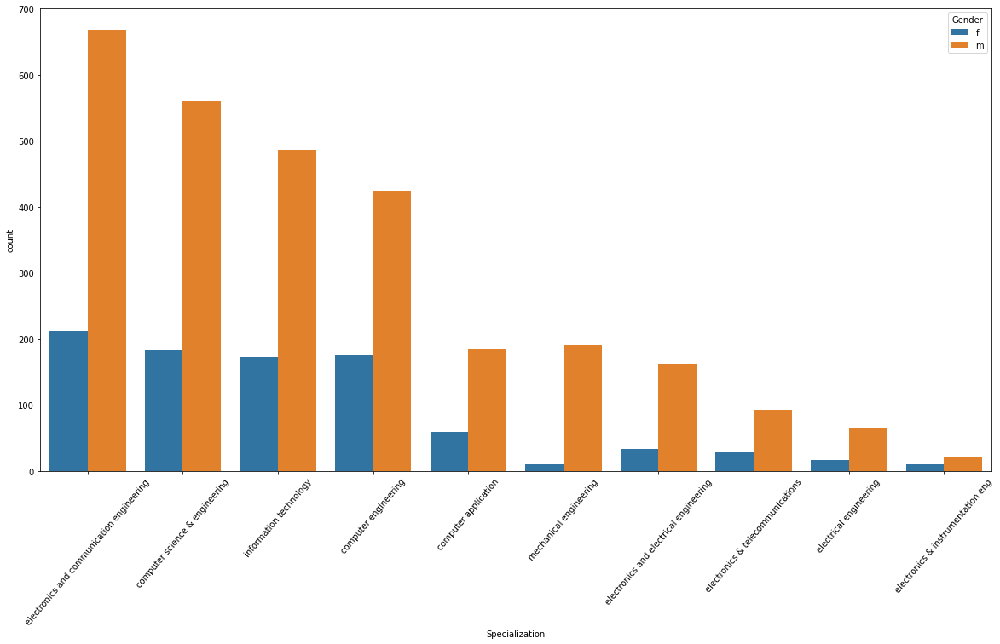

In [ ]:
plt.figure(figsize = (20,10))
sns.countplot(x = df["Specialization"], hue=df['Gender'], order=df["Specialization"].value_counts().iloc[:10].index)
plt.xticks(rotation=50)
plt.show()

From above graph we can say that in each specialization number of males are higher than females.

Maximum number of males and females selected Electronics and communication engineering branch followed by computer science and information technology branch.